# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 05.10.2023

Мягкий дедлайн: 23:59MSK 18.10.2023

Жесткий дедлайн: 23:59MSK 22.10.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [724]:
#!pip install folium

In [725]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)
m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [726]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set(style="darkgrid")

np.random.seed(0)

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [727]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train = pd.read_csv(r"C:\Users\MainAccount\Downloads\train.csv")

Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [728]:
train.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='str')

In [729]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train.drop(columns=['dropoff_datetime'], inplace=True)
train['pickup_datetime'] = train['pickup_datetime'].astype('datetime64[ms]')
display(train['pickup_datetime'].dtype)
(train.columns == 'dropoff_datetime').sum() 



dtype('<M8[ms]')

np.int64(0)

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

(array([1.45864e+06, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        2.00000e+00, 1.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([1.0000000e+00, 3.5262910e+05, 7.0525720e+05, 1.0578853e+06,
        1.4105134e+06, 1.7631415e+06, 2.1157696e+06, 2.4683977e+06,
        2.8210258e+06, 3.1736539e+06, 3.5262820e+06]),
 <BarContainer object of 10 artists>)

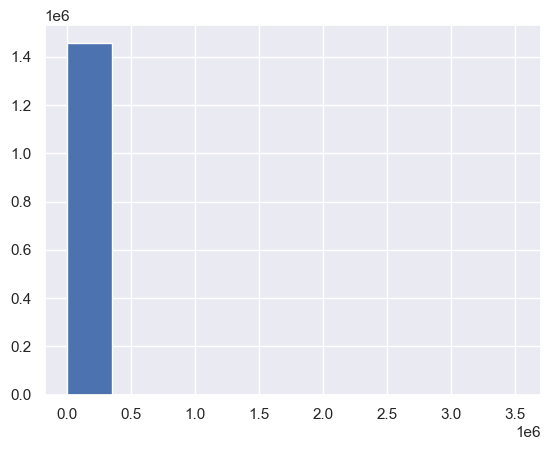

In [730]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
plt.hist(x = train['trip_duration'], bins = 10)

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В выборке есть выбросы, когда продолжительность поездки была значительно больше среднего

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

(array([2.16600e+03, 4.75300e+03, 8.21130e+04, 7.90004e+05, 5.61673e+05,
        1.58480e+04, 1.11000e+02, 1.97200e+03, 0.00000e+00, 4.00000e+00]),
 array([ 1.09861229,  2.49632658,  3.89404087,  5.29175516,  6.68946945,
         8.08718374,  9.48489803, 10.88261231, 12.2803266 , 13.67804089,
        15.07575518]),
 <BarContainer object of 10 artists>)

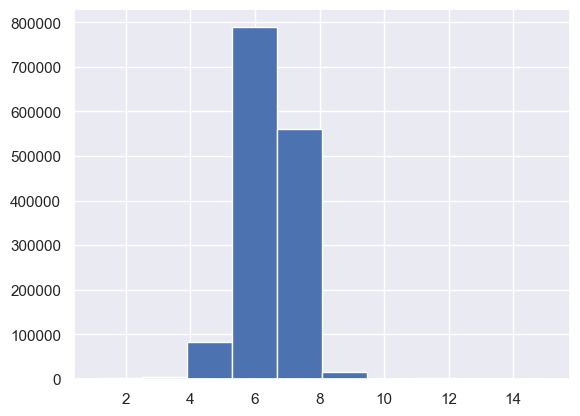

In [731]:
plt.hist(np.log1p(1 + train['trip_duration']), bins = 10)

*Логарифмирование целевой переменной поможет с выбросами, далее ошибка будет околоотносительная. Но будто бы можно было взять ассимитричную ошибку, ведь пользователю принципиальней когда время поездки больше заданного. Мб что-то тип того |(y_pred - y_true) / y_pred| при y_pred != 0*

In [732]:
train['trip_duration'].describe()

count    1.458644e+06
mean     9.594923e+02
std      5.237432e+03
min      1.000000e+00
25%      3.970000e+02
50%      6.620000e+02
75%      1.075000e+03
max      3.526282e+06
Name: trip_duration, dtype: float64

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
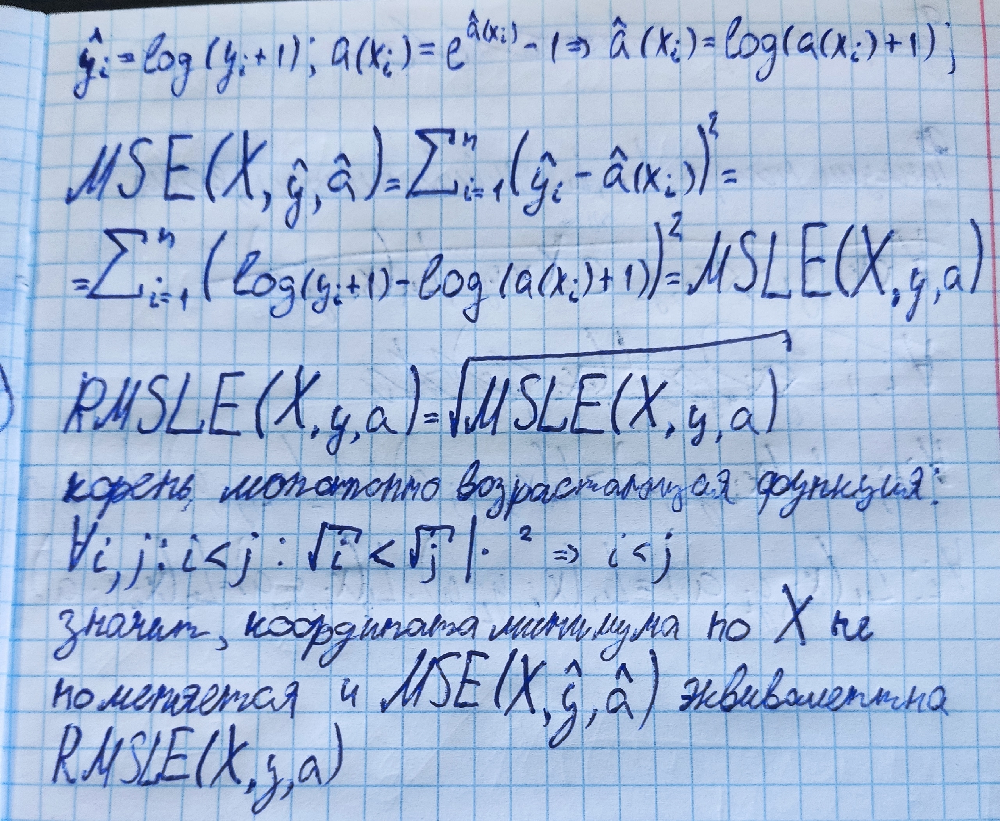
Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

In [733]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train['log_trip_duration'] = np.log1p(train['trip_duration'])
train = train.drop(columns = ['trip_duration'])

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [734]:
from scipy.stats import mode
def rmsle(log1p_y_true, log1p_y_pred): 
    #╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
    return np.sqrt(np.sum(np.pow(log1p_y_true - log1p_y_pred, 2))/len(log1p_y_true))
    raise NotImplementedError
funcs = [np.mean,  np.median, lambda x: mode(x).mode]
y_true = train['log_trip_duration']
result = [rmsle(y_true, f(y_true)) for f in funcs]

display(funcs[np.argmin(result)])

rmsle_best_const =np.min(result)
print(rmsle_best_const)
assert np.allclose(rmsle_best_const, 0.79575, 1e-4)

<function mean at 0x000001A9800E56B0>

0.7957592365411507


In [735]:
help(mode)

Help on function mode in module scipy.stats._stats_py:

mode(a, axis=0, nan_policy='propagate', keepdims=False)
    Return an array of the modal (most common) value in the passed array.

    If there is more than one such value, only one is returned.
    The bin-count for the modal bins is also returned.

    Parameters
    ----------
    a : array_like
        Numeric, n-dimensional array of which to find mode(s).
    axis : int or None, default: 0
        If an int, the axis of the input along which to compute the statistic.
        The statistic of each axis-slice (e.g. row) of the input will appear in a
        corresponding element of the output.
        If ``None``, the input will be raveled before computing the statistic.
    nan_policy : {'propagate', 'omit', 'raise'}
        Defines how to handle input NaNs.

        - ``propagate``: if a NaN is present in the axis slice (e.g. row) along
          which the  statistic is computed, the corresponding entry of the output
        

## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

In [736]:
train['day_of_year'] = train['pickup_datetime'].dt.day_of_year
len(train['day_of_year'].unique())

182

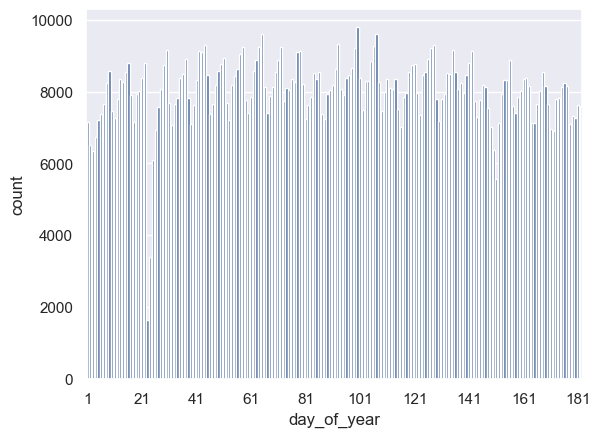

In [737]:
sns.countplot(x = train['day_of_year'])
plt.xticks(np.arange(0, 182, 20))
plt.show()

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

(21.0, 25.0)

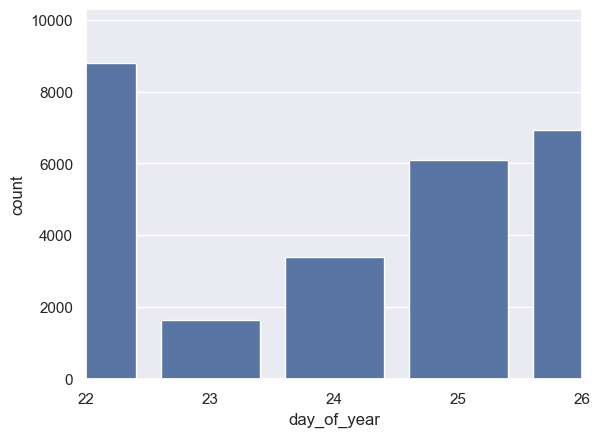

In [738]:
sns.countplot(x = train['day_of_year'])
plt.xlim(left = 21, right = 25)

https://ru.wikipedia.org/wiki/%D0%A3%D1%80%D0%B0%D0%B3%D0%B0%D0%BD_%D0%B2_%D0%A1%D0%A8%D0%90_(%D1%8F%D0%BD%D0%B2%D0%B0%D1%80%D1%8C_2016)

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

Text(-17.055555555555557, 0.5, 'frequency of trips per day')

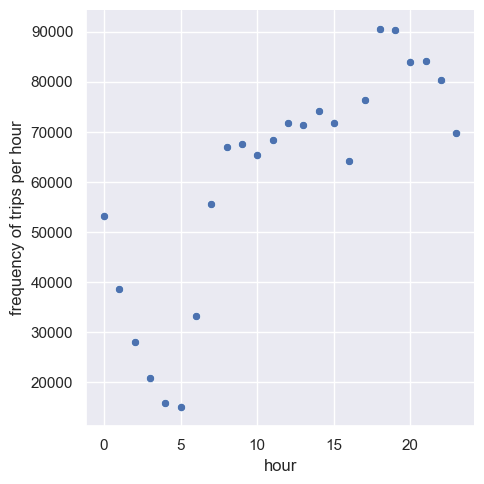

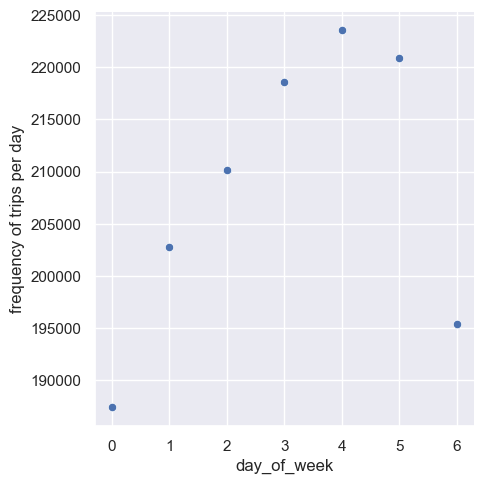

In [739]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train['hour'] = train['pickup_datetime'].dt.hour
sns.relplot(x = train['hour'], y = train.groupby('hour').transform('size'))
plt.ylabel('frequency of trips per hour')
train['day_of_week'] = train['pickup_datetime'].dt.day_of_week
sns.relplot(x = train['day_of_week'], y = train.groupby('day_of_week').transform('size'))
plt.ylabel('frequency of trips per day')

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

In [740]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
train['month'] = train['pickup_datetime'].dt.month
#sns.relplot(x = train['hour'], y = train['month'], hue = train.groupby(['hour', 'month']).transform('size'))
#sns.relplot(x = train['hour'], y = train['day_of_week'], hue = train.groupby(['hour', 'day_of_week']).transform('size'))

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

-------------------------------------------------------------------------------------------------------------
*Время суток*: в 1-6 a.m. минимальный, т.к. основная масса людей спит, 6-9 p.m. прайм-тайм, люди возвращаются с работы/едут гулять (на обоих ситуация идентична)


*Дни недели*: четверг, пятниц*а, суббота - конец недели, люди едут на заслуженный отдых. В понедельник спрос меньше - все работают.


*Месяца*: примерно одинакова статистика

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3 (используйте `train_test_split` из `sklearn`). По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [741]:
from sklearn.model_selection import train_test_split

X, y = train.drop(columns = ['log_trip_duration']), train['log_trip_duration']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
common_train = X.assign(log_trip_duration = y)


# sns.relplot(x = X_train['day_of_week'].unique(), y = common_train.groupby('day_of_week')['log_trip_duration'].mean())
# plt.xlabel('day of week')
# sns.relplot(x = X_train['hour'].unique(), y = common_train.groupby('hour')['log_trip_duration'].mean())
# plt.xlabel('hour in a day')
# sns.relplot(x = X_train['day_of_year'], y = common_train.groupby('day_of_year')['log_trip_duration'].mean())
# plt.xlabel('day of year')

In [742]:
x = common_train.groupby('day_of_year')['log_trip_duration'].mean()
display(x.mean(), x.median(), x.mode()[0])
display(train[train['day_of_year'] == 23]['log_trip_duration'].mean(),
        train[train['day_of_year'] == 24]['log_trip_duration'].mean())

np.float64(6.465208203010186)

np.float64(6.462258157599654)

np.float64(6.261898045579466)

np.float64(6.455999667470519)

np.float64(6.395088902209439)

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

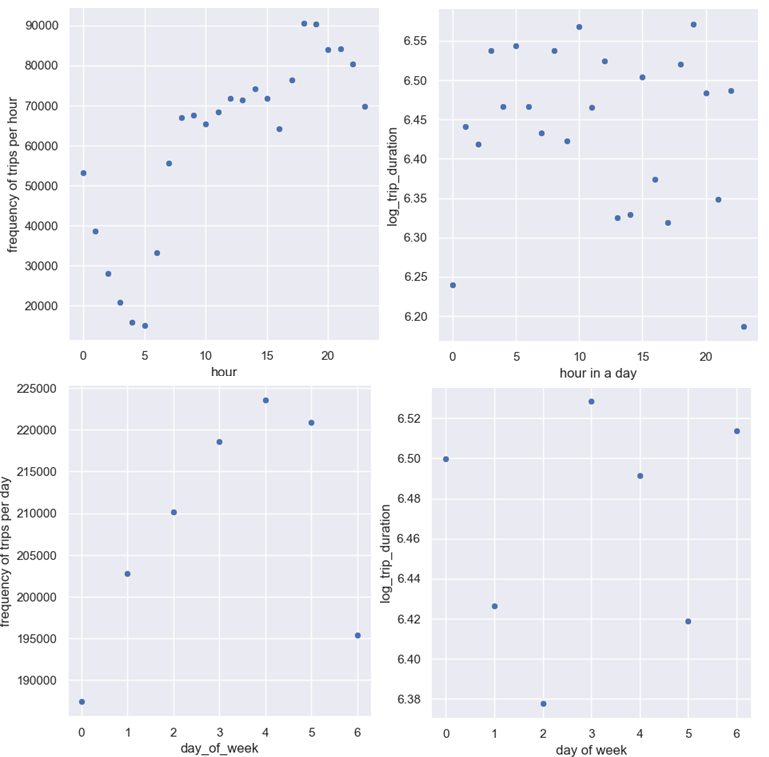

Если и есть какие-то общие паттерны, то это количество поездок обратнопропорционально времени этих поездок. Так может происходить, потому что количество дальних поездок примерно одинаково, а в прайм-тайм или в кофе-брейк-тайм добавляется большое количество коротких поездок до кафе или дома. Особенно эта обратная зависимость заметна в среду и в субботу  


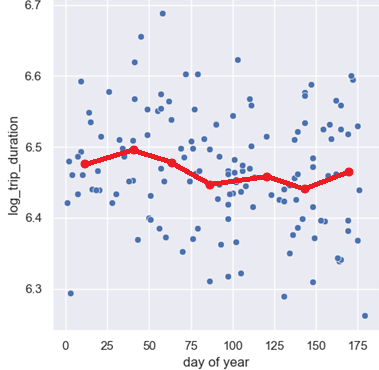


График довольно ровный, будто бы его очень достаточно характеризует y = mean() или median() (они всё равно одинаковые по значению)

Касаемо аномалий, среднее по целевой переменной немного упало 24-ого относительно среднего или медианы, поездки были короче, возможно, потому, что часть их отменялась в процессе из-за урагана

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [743]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for df in (X_train, X_test):
    df['anomaly_1'] = df['day_of_year'] == 23
    df['anomaly_2'] = df['day_of_year'] == 24

Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков _стоит рассматривать в этой задаче_   как категориальные, а какие - как численные? Почему?

In [744]:
common_train.apply(func = lambda x: len(x.unique()), axis = 0)

id                    1458644
vendor_id                   2
pickup_datetime       1380222
passenger_count            10
pickup_longitude        23047
pickup_latitude         45245
dropoff_longitude       33821
dropoff_latitude        62519
store_and_fwd_flag          2
day_of_year               182
hour                       24
day_of_week                 7
month                       6
log_trip_duration        7417
dtype: int64

Флаги будут категориальными, преобразования datetime'а, а passenger_count вещественный, т.к. метрика между значениями уместна. id, pickup_datetime не будем использовать

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [745]:
X_train.dtypes

id                               str
vendor_id                      int64
pickup_datetime       datetime64[ms]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag               str
day_of_year                    int32
hour                           int32
day_of_week                    int32
month                          int32
anomaly_1                       bool
anomaly_2                       bool
dtype: object

In [746]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.linear_model import Ridge
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import root_mean_squared_error

categorical = ['day_of_year', 'hour', 'day_of_week', 'month']
numerical = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']
bools = ['anomaly_1', 'anomaly_2']
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numerical),
    ('bool', 'passthrough', bools)
])
pipeline = Pipeline(steps=[('transforming', column_transformer), ('regression', Ridge())])
model = pipeline.fit(X_train, y_train)
print(root_mean_squared_error(y_test, model.predict(X_test)))


0.7716470591838889


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [747]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location, control_scale=True)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [748]:
import pickle
m = show_circles_on_map(df.sample(1000), "pickup_latitude", "pickup_longitude", "blue")
with open("map_object.pkl", "wb") as f:
    pickle.dump(m, f)

In [749]:
show_circles_on_map(df.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие пункты (или скопления точек, в количестве 2-3), по вашему мнению, выделяются на карте от основной массы и могут быть полезны для нашей задачи? Почему вы их выбрали? В чём особенность этих скоплений точек для нашей задачи?

это какие-то пригороды или удалённые районы, из которых ехать в центр далеко, их можно выделить в отдельный класс
Kings County, Queens County, аэропорт Кеннеди, LaGuardia аэропорт и т.д.

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [750]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h
def dummy_manhattan_distance(lat1, lng1, lat2, lng2):
    a = haversine_array(lat1, lng1, lat1, lng2)
    b = haversine_array(lat1, lng1, lat2, lng1)
    return a + b
for df in [X_train, X_test]:
    df.loc[:, 'haversine'] = haversine_array(df['pickup_latitude'].values, 
                                                      df['pickup_longitude'].values, 
                                                      df['dropoff_latitude'].values,
                                                      df['dropoff_longitude'].values)
    # df.loc[:, 'distance_dummy_manhattan'] = dummy_manhattan_distance(df['pickup_latitude'].values, 
    #                                                                 df['pickup_longitude'].values, 
    #                                                                 df['dropoff_latitude'].values, 
    #                                                                 df['dropoff_longitude'].values)

Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку `log_haversine`:

In [751]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for df in [X_train, X_test]:
    df['log_haversine'] = np.log1p(df['haversine'])

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [752]:
your_df = X_train.assign(log_trip_duration = y_train)
assert your_df['log_haversine'].corr(your_df['log_trip_duration']) > your_df['haversine'].corr(your_df['log_trip_duration'])

In [753]:
your_df['log_haversine'].corr(your_df['log_trip_duration']) , your_df['haversine'].corr(your_df['log_trip_duration'])

(np.float64(0.7499594955685667), np.float64(0.5654059873890225))

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

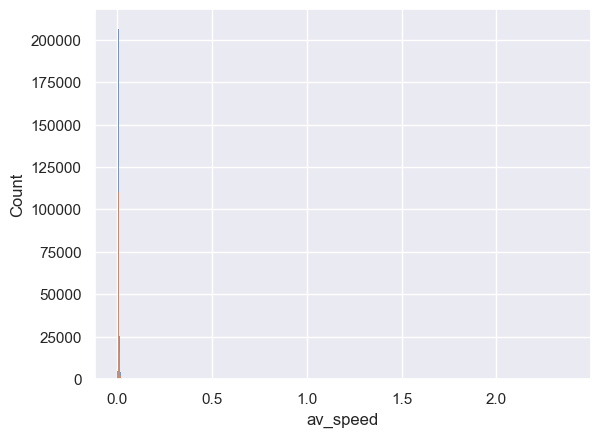

In [754]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
common_train, common_test = X_train.assign(log_trip_duration = y_train), X_test.assign(log_trip_duration = y_test)
for df in [common_train, common_test]:
    df['av_speed'] = np.exp(df['log_haversine'] - df['log_trip_duration']) 
    sns.histplot(data = df, x=df['av_speed'])

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

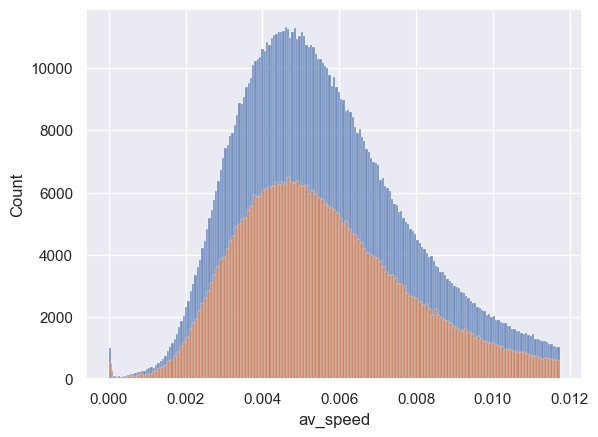

In [755]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for df in [common_train, common_test]:
    df = df[df['av_speed'] < df['av_speed'].quantile(0.95)]
    sns.histplot(data = df, x ='av_speed')

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

<Axes: xlabel='hour', ylabel='day_of_week'>

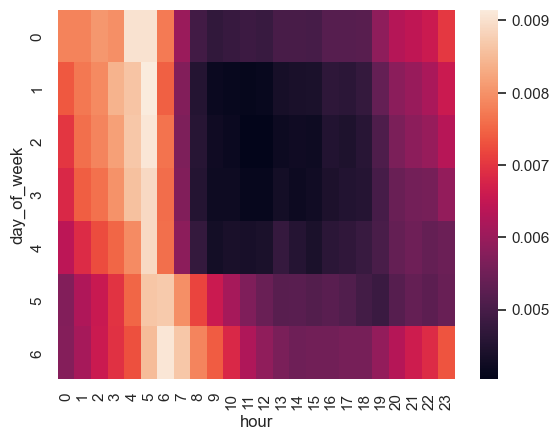

In [756]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ 
sns.heatmap(common_train.groupby(['day_of_week', 'hour'])['av_speed'].median().unstack())

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

In [757]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
((X_train.columns == 'av_speed') + (X_test.columns == 'av_speed')).sum()

np.int64(0)

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

Среда/Четверг в 11-12 a.m. скорость минимальна
Мала она со вторника по пятницу с 8 a.m. до 6 p.m.

Около 5 a.m. любого дня, особенно будней скорость максимальна

In [758]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for df in [X_train, X_test]:
    df['empty_road'] = ((df['day_of_week'] == 0) & (df['hour'] == 4) | 
                        (df['day_of_week'] > 5 ) & (df['hour'] == 6) | 
                        (df['day_of_week'] == 6) & (df['hour'] == 7) |
                        (df['hour'] == 5))
    df['full_road'] =  ((df['day_of_week'] > 1) & (df['day_of_week'] < 5) &
                         (df['hour'] > 7) & (df['hour'] < 19))

In [759]:
X_train[['pickup_longitude', 'dropoff_latitude']].sample(3)

,pickup_longitude,dropoff_latitude
449625,-73.983238,40.759140
558447,-73.993538,40.719006
997236,-73.872925,40.779221


**Задание 8 (0.25 балла)**. Для каждого из замеченных вами выше 2-3 пунктов добавьте в выборку по два признака: 
- началась ли поездка в этом пункте
- закончилась ли поездка в этом пункте

Как вы думаете, почему эти признаки могут быть полезны?

In [760]:
places = [['Kennedy', 40.645, -73.783, 0.7], ['LaGuardia', 40.7766, -73.866, 1.2]]
i = 1
location = places[i][1:3]
m = folium.Map(location=location)
folium.Circle(
    radius=1000*places[i][3],
    location=location,
    fill=True
).add_to(m)
m

In [761]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for df in [X_train, X_test]:
    for i in ['pickup','dropoff']:
        for place in places:
            lat1, lng1 = df[i + '_latitude'], df[i + '_longitude']
            lat2, lng2 = place[1], place[2]
            lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
            lat = lat2 - lat1
            lng = lng2 - lng1
            d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
            AVG_EARTH_RADIUS = 6371
            h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
            df[place[0] + '_' + i] = h < place[3]

In [762]:
for i in ['pickup','dropoff']:
    for j in np.array(places)[:, 0]:
        print(f'{j} {i} is: {(X_train[j + '_'+ i] == True).sum()}')
print(f'len of sample is: {len(X_train)}')
# наверное, и норм

Kennedy pickup is: 21432
LaGuardia pickup is: 24880
Kennedy dropoff is: 8044
LaGuardia dropoff is: 12080
len of sample is: 1021050


Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

In [763]:
X_train.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'passenger_count',
       'pickup_longitude', 'pickup_latitude', 'dropoff_longitude',
       'dropoff_latitude', 'store_and_fwd_flag', 'day_of_year', 'hour',
       'day_of_week', 'month', 'anomaly_1', 'anomaly_2', 'haversine',
       'log_haversine', 'empty_road', 'full_road', 'Kennedy_pickup',
       'LaGuardia_pickup', 'Kennedy_dropoff', 'LaGuardia_dropoff'],
      dtype='str')

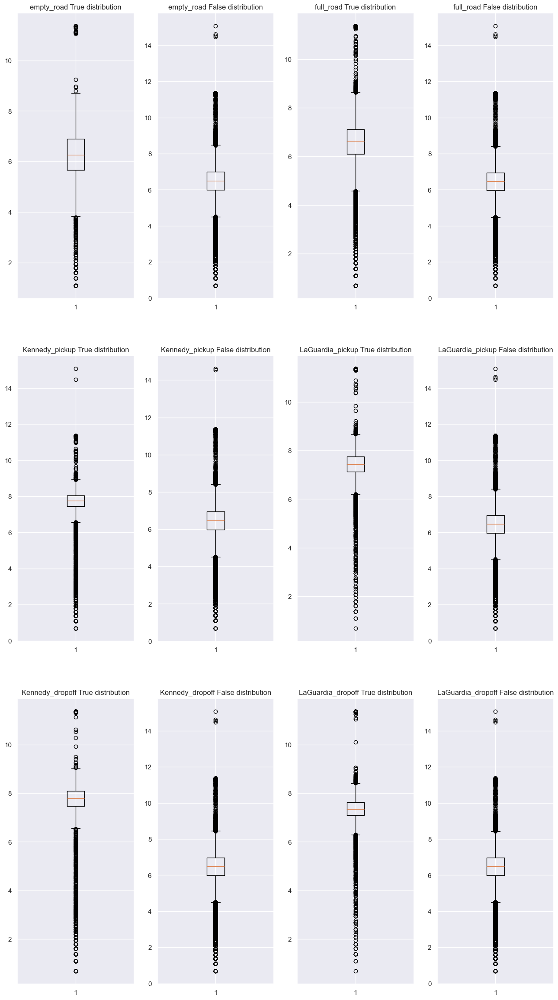

In [764]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
fig = plt.figure(figsize=(16, 60))
common_train = X_train.assign(log_trip_duration = y_train)
i = 1
cols_count = int((len(X_train.columns) - X_train.columns.get_loc('empty_road')))
for col_name in X_train.loc[:, 'empty_road':].columns:
    for j in [True, False]:
        ax = fig.add_subplot(cols_count, 4, i)
        ax.set_title(f'{col_name} {j} distribution')
        ax.boxplot(x=common_train.loc[common_train[col_name] == j, 'log_trip_duration'])
        i += 1
plt.show()

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

Прекрасные, однако аномалий с обоих сторон много. Зато порог аномалий задан довольно точно, т.к. усы boxplot были рассчитаны на нормальном распределении, а у нас на всех графиках значение медианы близко к значению среднего выборки с перцентилями от 25 до 75, значит, распределение околосимметрично(у симметричных распределений медиана, мода и среднее совпадают) и нет перекосов попадания конкретного эксперимента за верхний или нижний ус

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

# черновик

In [765]:
bound = np.array([[40.8, -74.02],[40.7, -73.94]])
bound_shape = (5, 3)
with open("map_object.pkl", "rb") as f:
    m_loaded = pickle.load(f)
    folium.Rectangle(
        bounds=bound,
        color="red",            # Цвет линии границы
        weight=2,               # Толщина линии границы в пикселях
        fill=True,              # Заливать ли внутреннюю область
        fill_color="yellow",    # Цвет заливки
        fill_opacity=0.2,       # Прозрачность заливки (от 0 до 1)
    ).add_to(m_loaded)

    cells__true = np.ndarray(bound_shape + (2,2,), X_train['pickup_latitude'].dtype) 
    d_lat = (bound[1, 0]-bound[0, 0])/bound_shape[0]
    d_lng = (bound[1, 1]-bound[0, 1])/bound_shape[1]
    for i in range(bound_shape[0]):
        for j in range(bound_shape[1]):
            cells__true[i, j] = np.array([bound[0], bound[0]]) + np.array([[d_lat*i, d_lng*j], [d_lat*(i+1), d_lng*(j+1)]])
            folium.Rectangle(
                bounds=cells__true[i, j],
                color="red",            # Цвет линии границы
                weight=2,               # Толщина линии границы в пикселях
            ).add_to(m_loaded)
m_loaded

In [766]:
# with open("map_object.pkl", "rb") as f:
#     m_loaded = pickle.load(f)
#     folium.Rectangle(
#     bounds=cells_[3, 2],
#     color="red",            # Цвет линии границы
#     weight=2).add_to(m_loaded)
# m_loaded

In [767]:
bound = np.array([[40.8, -74.02],[40.7, -73.94]])
bound_shape = (5, 3)
x,y = bound_shape
a,b = np.arange(x)[:, np.newaxis], np.arange(y)[np.newaxis, :]
rows = np.broadcast_to(a, bound_shape)
cols = np.broadcast_to(b, bound_shape)
cycle = np.moveaxis(np.stack([rows, cols]), 0, 2)

d_lat = (bound[1, 0]-bound[0, 0])/x
d_lng = (bound[1, 1]-bound[0, 1])/y
cells_ = np.stack([bound[0] + [d_lat, d_lng]*cycle , bound[0] + [d_lat, d_lng]*(cycle+1)])
cells_ = np.moveaxis(cells_, 0, 2)
with open("map_object.pkl", "rb") as f:
    m_loaded = pickle.load(f)
    d_lat = (bound[1, 0]-bound[0, 0])/bound_shape[0]
    d_lng = (bound[1, 1]-bound[0, 1])/bound_shape[1]
    for i in range(bound_shape[0]):
        for j in range(bound_shape[1]):
            folium.Rectangle(
                bounds=cells_[i, j],
                color="red",            # Цвет линии границы
                weight=2,               # Толщина линии границы в пикселях
            ).add_to(m_loaded)
m_loaded

In [768]:
print(cells_[0, 0, 0, 1] < cells_[0,0,1,1], cells_[0, 0, 0, 0] > cells_[0,0,1,0])

True True


In [769]:
X = X_train.iloc[[12354, 131, 1, 13556, 9971, 84, 89]]
X['pickup_cell'] = -1
X['dropoff_cell'] = -1        
for k in ['pickup', 'dropoff']:
    for i in range(bound_shape[0]):
        for j in range(bound_shape[1]):
            mask = ((cells_[i, j, 1, 0] < X[k + '_latitude']) & (X[k + '_latitude'] <= cells_[i, j, 0, 0]) & 
            (cells_[i, j, 1, 1] > X[k + '_longitude']) & (X[k + '_longitude'] >= cells_[i, j, 0, 1]))
            X.loc[X[k + '_cell'] == -1, k + '_cell'] = X.loc[X[k + '_cell'] == -1, k + '_cell'].where(cond=~mask, other=i*bound_shape[1] + j)
            X.loc[X[k + '_cell'] == -1]

for k in ['pickup', 'dropoff']:
    print(f'{k}\n')
    display(X[[k + '_latitude', k + '_longitude', k + '_cell']])
print('bound')
display(bound)

pickup



,pickup_latitude,pickup_longitude,pickup_cell
1406662,40.727180,-73.985512,10
151762,40.769569,-73.863091,-1
178550,40.746296,-73.977623,7
932748,40.777081,-73.979111,4
566391,40.762611,-73.982025,4
6309,40.738323,-73.983650,10
234950,40.755997,-73.990181,7


dropoff



,dropoff_latitude,dropoff_longitude,dropoff_cell
1406662,40.803009,-73.940392,-1
151762,40.764469,-73.983398,4
178550,40.788933,-73.968414,1
932748,40.758923,-73.993629,6
566391,40.762306,-73.983910,4
6309,40.773342,-73.870293,-1
234950,40.704239,-73.964226,14


bound


array([[ 40.8 , -74.02],
       [ 40.7 , -73.94]])

In [770]:
X = X_train.iloc[[12354, 131, 1, 13556, 9971, 84, 89]]
arr_lat = np.append(cells_[:,0,0,0], bound[1,0]).reshape(1, -1)
arr_lng = np.append(cells_[0,:,0,1], bound[1,1]).reshape(1, -1)
for k in ['pickup']:# , 'dropoff'
    lat_br = np.broadcast_to(arr_lat, (len(X), arr_lat.shape[-1])) - X[k + '_latitude'].to_numpy().reshape(-1, 1)
    lng_br = np.broadcast_to(arr_lng, (len(X), arr_lng.shape[-1])) - X[k + '_longitude'].to_numpy().reshape(-1, 1)

    non_neg_lat = np.where(lat_br < 0, 361, lat_br)
    non_neg_lng = np.where(lng_br < 0, 361, lng_br)
    couple_cell_id = np.stack([np.argmin(non_neg_lat, axis = 1), np.argmin(non_neg_lng, axis = 1)]) + 1
    
    mask = np.isclose(non_neg_lat[np.arange(len(X)), couple_cell_id[0] - 1], 361) | np.isclose(non_neg_lng[np.arange(len(X)), couple_cell_id[1] - 1], 361)
    couple_cell_id.T[mask] = [0, 0]
    cell_id = couple_cell_id[0]*bound_shape[1] + couple_cell_id[1] - 1
    cell_id[cell_id != -1] -= bound_shape[1] + 1
    print(f'cell_id {cell_id}')

cell_id [10 -1  7  4  4 10  7]


In [771]:
a, b = np.arange(bound_shape[0]).reshape(-1, 1), np.arange(bound_shape[1]).reshape(1, -1)
a, b = np.broadcast_to(a, bound_shape), np.broadcast_to(b, bound_shape)
iters = a * bound_shape[1] + b
cycle = np.moveaxis(np.stack([a,b]), 0, -1)
for X in [X_train, X_test]:
    X = X_train.iloc[[12354, 131, 1, 13556, 9971, 84, 89]]
    X['pickup_cell'] = -1
    X['dropoff_cell'] = -1
    for k in ['pickup', 'dropoff']:
        arr_lat = np.append(cells_[:,0,0,0], bound[1,0]).reshape(1, -1)
        arr_lng = np.append(cells_[0,:,0,1], bound[1,1]).reshape(1, -1)

        lat_br = np.broadcast_to(arr_lat, (len(X), arr_lat.shape[-1])) - X[k + '_latitude'].to_numpy().reshape(-1, 1)
        lng_br = np.broadcast_to(arr_lng, (len(X), arr_lng.shape[-1])) - X[k + '_longitude'].to_numpy().reshape(-1, 1)

        non_neg_lat = np.where(lat_br < 0, 361, lat_br)
        non_neg_lng = np.where(lng_br < 0, 361, lng_br)
        couple_cell_id = np.stack([np.argmin(non_neg_lat, axis = 1), np.argmin(non_neg_lng, axis = 1)]) + 1
        
        mask = np.isclose(non_neg_lat[np.arange(len(X)), couple_cell_id[0] - 1], 361) | np.isclose(non_neg_lng[np.arange(len(X)), couple_cell_id[1] - 1], 361)
        couple_cell_id.T[mask] = [0, 0]
        cell_id = couple_cell_id[0]*bound_shape[1] + couple_cell_id[1] - 1
        cell_id[cell_id != -1] -= bound_shape[1] + 1
        print(f'cell_id {cell_id}')

cell_id [10 -1  7  4  4 10  7]
cell_id [-1  4  1  6  4 -1 14]
cell_id [10 -1  7  4  4 10  7]
cell_id [-1  4  1  6  4 -1 14]


# .

In [772]:
from sklearn.base import BaseEstimator, TransformerMixin


# TransformerMixin implements fit_transform for you,
# applying your fit and transform consistently
    
class MapGridTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, bound = np.array([[40.8, -74.02],[40.7, -73.94]]), bound_shape = (5, 3)):
        self.bound = bound
        self.bound_shape = bound_shape
        # your code here 
    
    def show_map(self):
        with open("map_object.pkl", "rb") as f:
            m_loaded = pickle.load(f)
            for i in range(self.bound_shape[0]):
                for j in range(self.bound_shape[1]):
                    folium.Rectangle(
                        bounds=self.cells_[i, j],
                        color="red",            # Цвет линии границы
                        weight=2,               # Толщина линии границы в пикселях
                    ).add_to(m_loaded)
        display(m_loaded)
    
    def fit(self, X=None, y=None):
        a,b = np.arange(self.bound_shape[0])[:, np.newaxis], np.arange(self.bound_shape[1])[np.newaxis, :]
        rows = np.broadcast_to(a, self.bound_shape)
        cols = np.broadcast_to(b, self.bound_shape)
        cycle = np.moveaxis(np.stack([rows, cols]), 0, 2)

        d_lat = (self.bound[1, 0]-self.bound[0, 0])/self.bound_shape[0]
        d_lng = (self.bound[1, 1]-self.bound[0, 1])/self.bound_shape[1]
        self.cells_ = np.stack([self.bound[0] + [d_lat, d_lng]*cycle , self.bound[0] + [d_lat, d_lng]*(cycle+1)])
        self.cells_ = np.moveaxis(self.cells_, 0, 2)
        # your code here
        return self

    def transform(self, X, y=None):
        X = X.copy()
        X['pickup_cell'] = -1
        X['dropoff_cell'] = -1
        for k in ['pickup', 'dropoff']:
            arr_lat = np.append(self.cells_[:,0,0,0], self.bound[1,0]).reshape(1, -1)
            arr_lng = np.append(self.cells_[0,:,0,1], self.bound[1,1]).reshape(1, -1)
    
            lat_br = np.broadcast_to(arr_lat, (len(X), arr_lat.shape[-1])) - X[k + '_latitude'].to_numpy().reshape(-1, 1)
            lng_br = np.broadcast_to(arr_lng, (len(X), arr_lng.shape[-1])) - X[k + '_longitude'].to_numpy().reshape(-1, 1)
    
            non_neg_lat = np.where(lat_br < 0, 361, lat_br)
            non_neg_lng = np.where(lng_br < 0, 361, lng_br)
            couple_cell_id = np.stack([np.argmin(non_neg_lat, axis = 1), np.argmin(non_neg_lng, axis = 1)]) + 1
            
            mask = np.isclose(non_neg_lat[np.arange(len(X)), couple_cell_id[0] - 1], 361) | np.isclose(non_neg_lng[np.arange(len(X)), couple_cell_id[1] - 1], 361)
            couple_cell_id.T[mask] = [0, 0]
            X[k + '_cell'] = couple_cell_id[0]*self.bound_shape[1] + couple_cell_id[1] - 1
            X.loc[X[k + '_cell'] != -1, k + '_cell'] -= self.bound_shape[1] + 1
        # your code here
        return X

In [706]:
inst = MapGridTransformer().fit(X_train.iloc[[12354, 131, 1, 13556, 9971, 84, 89]])
display(inst.transform(X_train.iloc[[12354, 131, 1, 13556, 9971, 84, 89]])['pickup_cell'])
inst.show_map()

1406662    10
151762     -1
178550      7
932748      4
566391      4
6309       10
234950      7
Name: pickup_cell, dtype: int64

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [707]:
X_train.dtypes

id                               str
vendor_id                      int64
pickup_datetime       datetime64[ms]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag               str
day_of_year                    int32
hour                           int32
day_of_week                    int32
month                          int32
anomaly_1                       bool
anomaly_2                       bool
haversine                    float64
log_haversine                float64
empty_road                      bool
full_road                       bool
Kennedy_pickup                  bool
LaGuardia_pickup                bool
Kennedy_dropoff                 bool
LaGuardia_dropoff               bool
dtype: object

In [708]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.pipeline import make_pipeline
categorical = ['day_of_year', 'hour', 'day_of_week', 'month', 'pickup_cell', 'dropoff_cell']
numerical = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'log_haversine']
bools = ['anomaly_1', 'anomaly_2', 'empty_road', 'full_road', 'Kennedy_pickup', 'LaGuardia_pickup', 'Kennedy_dropoff', 'LaGuardia_dropoff']
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numerical),
    ('bool', 'passthrough', bools)
])
pipeline = Pipeline(steps=[
    ('cells', MapGridTransformer()),
    ('transform', column_transformer),
    ('ridge', Ridge())
])
model = pipeline.fit(X_train, y_train)
print(root_mean_squared_error(y_test, model.predict(X_test)))

0.47489082278294226


## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

vendor_id, store_and_fwd_flag сделаем булевыми, а passenger_count численным признаком, т.к. в нём уместна метрика между значениями

Возможно, такси с разными vendor_id занимаются разными перевозками. Одни загородными, другие работают внутри города
Если поездка дальняя, то passenger_count может быть больше из-за объединения людей в группы в целях экономии
store_and_fwd_flag если 1, то нет связи в районе, скорее всего это за городом 

In [709]:
# common_train = X_train.assign(target = y_train)
# means_vendor = common_train.groupby('vendor_id')['target'].mean()
# means_flag = common_train.groupby('store_and_fwd_flag')['target'].mean()

# fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# sns.scatterplot(x=means_vendor.index, y=means_vendor.values, ax=axes[0])
# axes[0].set_title('Зависимость средней log_trip_duration от vendor_id')

# sns.scatterplot(x=means_flag.index, y=means_flag.values, ax=axes[1])
# axes[1].set_title('Зависимость средней log_trip_duration от store_and_fwd_flag')


In [710]:
# fig, axes = plt.subplots(1, 2, figsize = (16, 10))
# axes[0].set_title('Распределение log_trip_duration от vendor_id')
# sns.scatterplot(x=X_train['vendor_id'], y = y_train, ax = axes[0])
# axes[1].set_title('Распределение log_trip_duration от store_and_fwd_flag')
# sns.scatterplot(x=X_train['store_and_fwd_flag'], y = y_train, ax = axes[1])

In [711]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for col in ['vendor_id', 'passenger_count', 'store_and_fwd_flag']:
    display(f'{col}: {len(X_train[col].unique())}')

'vendor_id: 2'

'passenger_count: 10'

'store_and_fwd_flag: 2'

Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

In [712]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# fig, axes = plt.subplots(2, 2, figsize = (16, 10))
# axes[0, 0].set_title('Распределение log_trip_duration от vendor_id')
# sns.boxplot(x=X_train['vendor_id'], y = y_train, ax = axes[0, 0])
# axes[0, 1].set_title('Распределение log_trip_duration от store_and_fwd_flag')
# sns.boxplot(x=X_train['store_and_fwd_flag'], y = y_train, ax = axes[0, 1])
# axes[1, 0].set_title('Распределение log_trip_duration от passenger_count')
# sns.boxplot(x=X_train['passenger_count'], y = y_train, ax = axes[1, 0])

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [713]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
for df in [X_train, X_test]:
    df['store_and_fwd_flag'] = df['store_and_fwd_flag'] == 'Y'
    df['vendor_id'] = df['vendor_id'] == 2

In [714]:
(df['passenger_count'] > 6).sum()/len(X_train)

np.float64(9.793839674844523e-07)

**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

Почти всегда среднее целевой переменной одинаково при любых значениях признаков, их ценность минимальна 

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [715]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
categorical = ['day_of_year', 'hour', 'day_of_week', 'month', 'pickup_cell', 'dropoff_cell']
numerical = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'log_haversine', 'passenger_count']
bools = ['anomaly_1', 'anomaly_2', 'empty_road', 'full_road', 'Kennedy_pickup', 'LaGuardia_pickup', 'Kennedy_dropoff', 'LaGuardia_dropoff', 'vendor_id', 'store_and_fwd_flag']
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numerical),
    ('bools', 'passthrough', bools)
])
pipeline = Pipeline([
    ('grid', MapGridTransformer()),
    ('transform', column_transformer),
    ('ridge', Ridge())
])
model = pipeline.fit(X_train, y_train)
print(root_mean_squared_error(y_true=y_test, y_pred = model.predict(X_test)))

0.47467968971766056


In [716]:
print(f'difference between 1st and 2nd experiment scores are: {0.47489082278294226 - 0.47467968971766056}')

difference between 1st and 2nd experiment scores are: 0.00021113306528169895


Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

In [717]:
X_test = X_test.drop(columns = ['vendor_id', 'passenger_count', 'store_and_fwd_flag'])
X_train = X_train.drop(columns = ['vendor_id', 'passenger_count', 'store_and_fwd_flag'])

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты (выбросы, или outliers): с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите __обучающую выборку__ от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

убрано: 0.002436707311101317


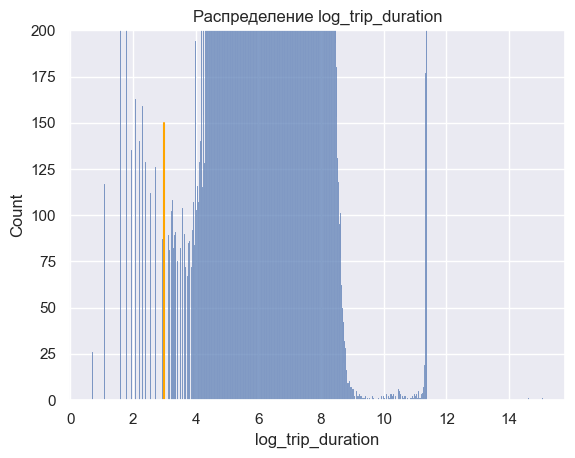

In [718]:
ORIGINAL_LEN = len(X_train)
plt.title('Распределение log_trip_duration')
top = 200
plt.ylim(top =  top)
sns.histplot(y_train)
y = np.arange(0, top, 50)
threshold = 3
plt.plot(np.full(y.shape, threshold), y, color='orange')
print(f'убрано: {(y_train < threshold).sum()/len(y_train)}')

# L = (y_train - model.predict(X_train))**2

In [719]:
X_train = X_train[y_train > threshold]
y_train = y_train[y_train > threshold]

Снизу убрано: 0.006698659482682449


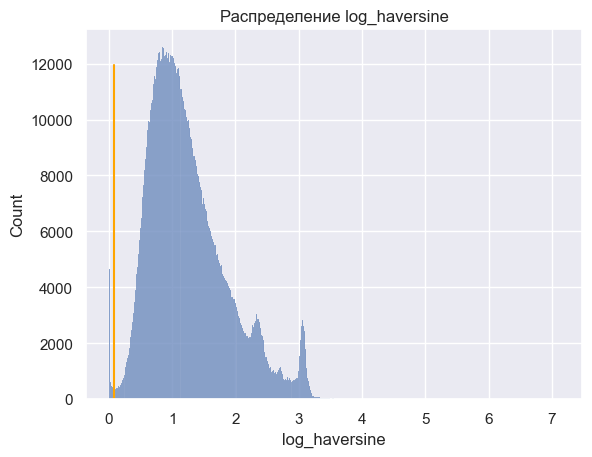

In [720]:
plt.title('Распределение log_haversine')
sns.histplot(X_train['log_haversine'])
# в задании не перечислено это, но много нулевых записей. Человек идёт 5 км/ч. 5/3.6 примерно 1.5 м/с. Странно заказывать такси, 
# если ты это же расстояние можешь пройти за минуту(тайминги светофоров для пешеходов и такси берём одинаковые), это 90м. 
bottom = np.log1p(90/1000)
print(f'Снизу убрано: {(X_train['log_haversine'] < bottom).sum()/len(X_train)}') 
y = np.arange(0, 12000, 50)
plt.plot(np.full(y.shape, bottom), y, color = 'orange')

убрано сверху: 0.0009965029129301898


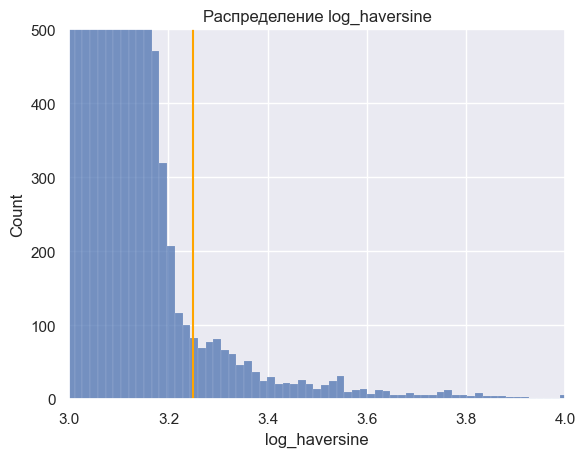

In [721]:
plt.title('Распределение log_haversine')
sns.histplot(X_train['log_haversine'])
plt.xlim(3, 4)
plt.ylim(top = 500)
# верхнюю оценку даже грубо сложно оценить, поэтому лучше обрубить тяжёлый хвост, например, на меньше сотни примеров
top = 3.25
print(f'убрано сверху: {(X_train['log_haversine'] > top).sum()/len(X_train)}')
plt.plot(np.full(y.shape, top), y, color='orange')

In [722]:
y_train = y_train[(bottom < X_train['log_haversine']) & (X_train['log_haversine'] < top)]
X_train = X_train[(bottom < X_train['log_haversine']) & (X_train['log_haversine'] < top)]

In [723]:
L = np.pow(model.predict(X_train) - y_train, 2)
# plt.title('Распределение ошибок')
# plt.ylabel('Величина ошибки')
# sns.scatterplot(x = y_train, y = L, alpha = 0.01)

# x = np.linspace(0, 12, 50)
# threshold = 3
# plt.plot(x, np.full(x.shape, threshold), color='orange')

display(f' выбросы: {(L > threshold).sum()/len(X_train)}')

ValueError: columns are missing: {'passenger_count', 'store_and_fwd_flag', 'vendor_id'}

In [ ]:
X_train = X_train[L < 3.5]
y_train = y_train[L < 3.5]

print(f'Всего удалено строк: {ORIGINAL_LEN - len(X_train)}, это {1 - len(X_train)/ORIGINAL_LEN}')

Всего удалено строк: 12771, это 0.012507712648743952


Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Для каждого категориального признака объедините действительно редкие категории в одну, если такие имеются (т.е. если категории действительно редкие). 

In [ ]:
X_train.apply(lambda x: len(x.unique()))

id                   1008279
pickup_datetime       970144
pickup_longitude       20227
pickup_latitude        41626
dropoff_longitude      29561
dropoff_latitude       56924
day_of_year              182
hour                      24
day_of_week                7
month                      6
anomaly_1                  2
anomaly_2                  2
haversine            1008275
log_haversine        1008275
empty_road                 2
full_road                  2
Kennedy_pickup             2
LaGuardia_pickup           2
Kennedy_dropoff            2
LaGuardia_dropoff          2
dtype: int64

Из небинарных категориальных признаков остались только day_of_year ,hour ,day_of_week ,month (cells_ не считается, там каждая клетка востребована)

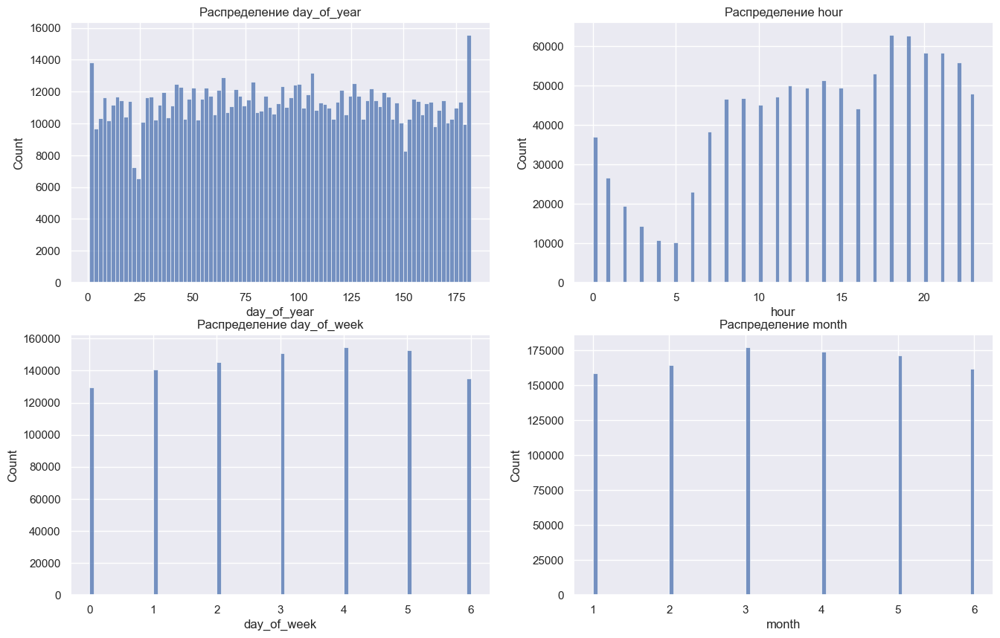

In [ ]:
fig, axes = plt.subplots(2,2, figsize = (16, 10))
i = 0
for col in ['day_of_year' ,'hour' ,'day_of_week' ,'month']:
    axes[i//2, i%2].set_title(f'Распределение {col}')
    sns.histplot(X_train[col], ax = axes[i//2, i%2], bins = 90)
    i+=1

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
frequency = X_train['day_of_year'].value_counts()
frequency

day_of_year
100    6753
107    6704
65     6554
106    6469
99     6440
       ... 
3      4392
25     4224
151    3869
24     2340
23     1129
Name: count, Length: 182, dtype: int64

In [ ]:
freq_h = X_train['hour'].value_counts()
freq_h

hour
18    63011
19    62783
21    58397
20    58393
22    55880
17    53107
14    51476
12    50097
15    49568
13    49467
23    48077
11    47341
9     46896
8     46604
10    45247
16    44294
7     38443
0     37113
1     26608
6     23066
2     19454
3     14393
4     10719
5     10290
Name: count, dtype: int64

In [ ]:
categorical = ['day_of_year', 'hour', 'day_of_week', 'month', 'pickup_cell', 'dropoff_cell']
numerical = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'log_haversine']
bools = ['anomaly_1', 'anomaly_2', 'empty_road', 'full_road', 'Kennedy_pickup', 'LaGuardia_pickup', 'Kennedy_dropoff', 'LaGuardia_dropoff']
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
    ('scaling', StandardScaler(), numerical),
    ('bool', 'passthrough', bools)
])
pipeline = Pipeline(steps=[
    ('cells', MapGridTransformer()),
    ('transform', column_transformer),
    ('ridge', Ridge())
])
model = pipeline.fit(X_train, y_train)
default_rmse = root_mean_squared_error(y_test, model.predict(X_test))

In [ ]:
def rare_detection_of_year(or_df):
    df = or_df.copy()
    mask = df['day_of_year'].isin(frequency[frequency < 3870].index)
    df['day_of_year'] = df['day_of_year'].astype(str)
    df.loc[mask, 'day_of_year'] = 'rare'
    mask = df['hour'].isin(freq_h[freq_h <= 26608])
    df['hour'] = df['hour'].astype(str)
    df.loc[mask, 'hour'] = 'rare'
    return df

def rare_detection_hour(or_df):
    df = or_df.copy()
    mask = df['hour'].isin(freq_h[freq_h <= 26608])
    df['hour'] = df['hour'].astype(str)
    df.loc[mask, 'hour'] = 'rare'
    return df

X_train_1 = rare_detection_of_year(X_train)
X_test_1 = rare_detection_of_year(X_test)
X_train_2 = rare_detection_hour(X_train)
X_test_2 = rare_detection_hour(X_test)

model_1 = pipeline.fit(X_train_1, y_train)
rmse_1 = root_mean_squared_error(y_true = y_test, y_pred= model_1.predict(X_test_1))

model_2 = pipeline.fit(X_train_2, y_train)
rmse_2 = root_mean_squared_error(y_true = y_test, y_pred = model_2.predict(X_test_2))

print(f'\n1st model\'s better on: {default_rmse - rmse_1}, \n2nd model\'s better on: {default_rmse - rmse_2}')



1st model's better on: -6.127294591801169e-05, 
2nd model's better on: -1.7195796203628433e-07


Моё разбиение на редкие вообще никаких изменений скора не привнесло, действительно редких значений нет 

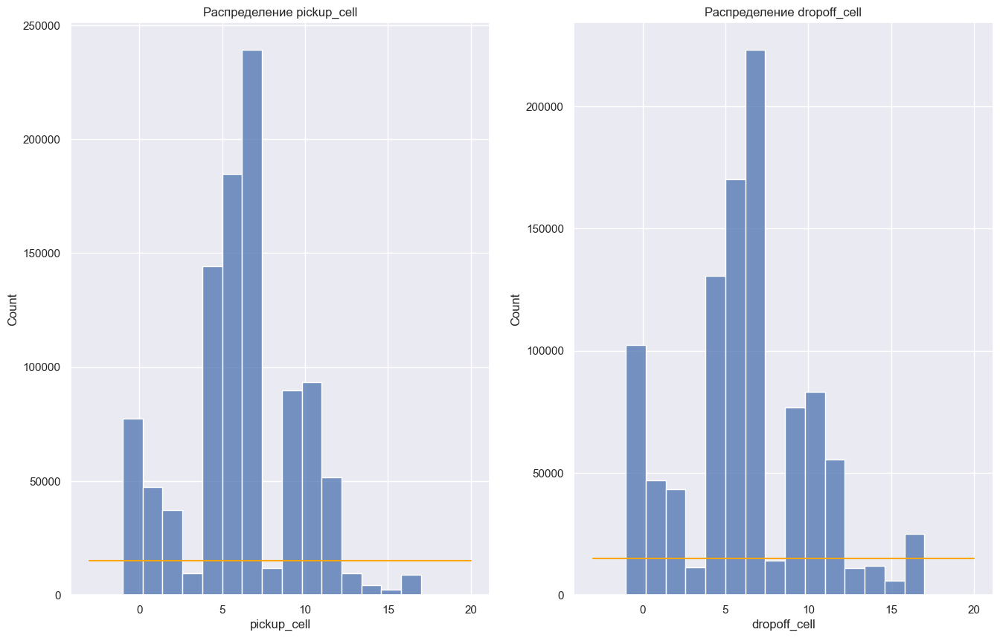

In [ ]:
df_cells = MapGridTransformer().fit_transform(X_train, y_train)
fig, axes = plt.subplots(1, 2, figsize = (16, 10))
axes[0].set_title('Распределение pickup_cell')
axes[1].set_title('Распределение dropoff_cell')
sns.histplot(df_cells['pickup_cell'], ax = axes[0], bins = 15)
sns.histplot(df_cells['dropoff_cell'], ax = axes[1], bins = 15)
p_threshold, d_threshold = 15000, 15000
x = np.linspace(-3, 20, 50)
axes[0].plot(x, np.full(x.shape, p_threshold), color='orange')
axes[1].plot(x, np.full(x.shape, d_threshold), color='orange')

In [ ]:
from sklearn.preprocessing import FunctionTransformer
class RareCells(FunctionTransformer, BaseEstimator):
    def __init__(self, thr_p = 15000, thr_d = 15000):
        self.thr_p, self.thr_d = thr_p, thr_d
    def fit(self, X, y = None):
        self.freq_p_, self.freq_d_ = X['pickup_cell'].value_counts(), X['dropoff_cell'].value_counts()
        self.ind_p_ = (self.freq_p_[self.freq_p_ < self.thr_p]).index
        self.ind_d_ = (self.freq_d_[self.freq_d_ < self.thr_d]).index
        return self
    def transform(self, X, y = None):
        X['pickup_cell'], X['dropoff_cell'] = X['pickup_cell'].astype(str), X['dropoff_cell'].astype(str)
        mask_p = X['pickup_cell'].isin(self.ind_p_)
        mask_d = X['dropoff_cell'].isin(self.ind_d_)
        X.loc[mask_p, 'pickup_cell'] = 'rare'
        X.loc[mask_d, 'dropoff_cell'] = 'rare'
        return X

In [ ]:
inst = RareCells().fit_transform(df_cells)
(inst['dropoff_cell'] == 'rare').sum()

np.int64(67640)

In [ ]:
pipeline_2 = Pipeline([
    ('grid', MapGridTransformer()), 
    ('rare_cells', RareCells()), 
    ('transform', column_transformer),
    ('ridge', Ridge())
])
model_2 = pipeline_2.fit(X_train, y_train)
rmse_2 = root_mean_squared_error(y_true = y_test, y_pred = model_2.predict(X_test))
print(f'New upd has been better score on: {rmse_2 - default_rmse}')


New upd has been better score on: 2.2582820502492496e-08


Опять результат удручающий

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
columns_count = len(X_train.columns)
print(columns_count - len(categorical), columns_count)

14 20


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.linear_model import Lasso
# pipeline_lasso = Pipeline([
#     ('grid', MapGridTransformer()),
#     ('transform', column_transformer), 
#     ('lasso', Lasso())
# ])
# model_lasso = pipeline_lasso.fit(X_train, y_train)
# print(root_mean_squared_error(y_true = y_test, y_pred = model_lasso.predict(X_test)))

0.7951943751096405


In [ ]:
# (model_lasso.named_steps['lasso'].coef_ != 0).sum()

np.int64(0)

Разбейте _обучающую выборку_ на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# categorical = ['day_of_year', 'hour', 'day_of_week', 'month', 'pickup_cell', 'dropoff_cell']
# numerical = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude', 'log_haversine', 'passenger_count']
# bools = ['anomaly_1', 'anomaly_2', 'empty_road', 'full_road', 'Kennedy_pickup', 'LaGuardia_pickup', 'Kennedy_dropoff', 'LaGuardia_dropoff', 'vendor_id', 'store_and_fwd_flag']
# column_transformer = ColumnTransformer([
#     ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical),
#     ('scaling', StandardScaler(), numerical),
#     ('bools', 'passthrough', bools)
# ])
# pipeline = Pipeline([
#     ('grid', MapGridTransformer()),
#     ('transform', column_transformer),
#     ('ridge', Ridge())
# ])
# model = pipeline.fit(X_train, y_train)
# print(root_mean_squared_error(y_true=y_test, y_pred = model.predict(X_test)))

0.47467968971766056


In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.model_selection import GridSearchCV
# X_trainx, X_val, y_trainx, y_val = train_test_split(X_train, y_train, test_size= 0.2, random_state=42)
# alphas = np.logspace(-4, 1, 20)

# searcher_lasso = GridSearchCV(pipeline_lasso, {'lasso__alpha':alphas}, cv = 5, n_jobs=-1)
# searcher_lasso.fit(X_val, y_val)
# pipeline_lasso.set_params(lasso__alpha = searcher_lasso.best_params_['lasso__alpha'])

# searcher_ridge = GridSearchCV(pipeline, {'ridge__alpha':alphas}, cv = 5, n_jobs=-1)
# searcher_ridge.fit(X_val, y_val)
# pipeline_2.set_params(ridge__alpha = searcher_ridge.best_params_['ridge__alpha'])

# lasso_model = pipeline_lasso.fit(X_trainx, y_trainx)
# ridge_model = pipeline.fit(X_trainx, y_trainx)

# print(f'Lasso\'s score is: {root_mean_squared_error(y_true = y_test, y_pred = lasso_model.predict(X_test))}')
# print(f'Ridge\'s score is: {root_mean_squared_error(y_true = y_test, y_pred = ridge_model.predict(X_test))}')
# оптимальным alpha был на валидационной выборке, но на обучающей он может быть другим, поэтому мб результат хуже

Lasso's score is: 0.48284321796587226
Ridge's score is: 0.4790587279986631


Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# for a in alphas:
#     pipeline_lasso.set_params(lasso__alpha = a)
#     print(f'{a}: {(pipeline_lasso.fit(X_trainx, y_trainx).named_steps['lasso'].coef_ == 0).sum()}')


c:\Users\MainAccount\ML3.12\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.041e+04, tolerance: 4.612e+01
  model = cd_fast.sparse_enet_coordinate_descent(


1e-06: 6


c:\Users\MainAccount\ML3.12\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.857e+03, tolerance: 4.612e+01
  model = cd_fast.sparse_enet_coordinate_descent(


2.335721469090121e-06: 13


c:\Users\MainAccount\ML3.12\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:675: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.349e+03, tolerance: 4.612e+01
  model = cd_fast.sparse_enet_coordinate_descent(


5.455594781168514e-06: 14
1.274274985703132e-05: 19
2.9763514416313192e-05: 39
6.951927961775606e-05: 70
0.0001623776739188721: 128
0.000379269019073225: 184
0.0008858667904100823: 206
0.002069138081114788: 224
0.004832930238571752: 252
0.011288378916846883: 261
0.026366508987303555: 264
0.061584821106602544: 268
0.14384498882876628: 268
0.3359818286283781: 268
0.7847599703514607: 269
1.8329807108324339: 269
4.281332398719387: 269
10.0: 269


In [ ]:
# pipeline_lasso.set_params(lasso__alpha = 0.0001623776739188721)
# half_model = pipeline_lasso.fit(X_trainx, y_trainx)
# print(0.48284321796587226 - root_mean_squared_error(y_true=y_test, y_pred = half_model.predict(X_test)))
# на лютых гениальничах получилось лучше 

-0.0028623303814053203


<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

In [798]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
class ManhattenTransformer(FunctionTransformer, BaseEstimator):
    def fit(self, X, y = None):
        inst = MapGridTransformer().fit_transform(X_train)
        a = inst[['pickup_cell', 'dropoff_cell']].value_counts()
        a = a.index.to_frame().assign(freq = a).reset_index(drop = True)
        b = inst[['dropoff_cell', 'pickup_cell']].value_counts()
        b = b.index.to_frame().assign(freq = b).reset_index(drop = True)
        self.cells_comb_ = a.merge(b, how = 'outer', on = ['pickup_cell', 'dropoff_cell'])
        self.cells_comb_['freq'] = self.cells_comb_['freq_x'] + self.cells_comb_['freq_y']
        self.cells_comb_ = self.cells_comb_.drop(columns = ['freq_x', 'freq_y'])
        self.cells_comb_ = self.cells_comb_.sort_values('freq')[-100:]
        for col in ['pickup_cell', 'dropoff_cell']:
            self.cells_comb_.loc[self.cells_comb_[col] == '-1', col] = 17
            self.cells_comb_.loc[self.cells_comb_[col] == 'rare', col] = 18
            self.cells_comb_[col] = self.cells_comb_[col].astype(int)
        return self
    def transform(self, X, y = None):
        for col in ['pickup_cell', 'dropoff_cell']:
            X.loc[X[col] == -1, col] = 17
            X.loc[X[col] == 'rare', col] = 18
            X[col] = X[col].astype(int)
        valid_pairs = pd.MultiIndex.from_frame(self.cells_comb_[['pickup_cell', 'dropoff_cell']])
        x_pairs     = pd.MultiIndex.from_frame(X[['pickup_cell', 'dropoff_cell']])

        mask = x_pairs.isin(valid_pairs)

        X['most_frequent'] = -1
        X.loc[mask, 'most_frequent'] = (
            X.loc[mask, 'pickup_cell'].astype(int) * 18
            + X.loc[mask, 'dropoff_cell'].astype(int)
        )
        X['most_frequent'] = -1
        X.loc[mask, 'most_frequent'] = X['pickup_cell']*18 + X['dropoff_cell']
        return X

<Axes: xlabel='most_frequent', ylabel='Count'>

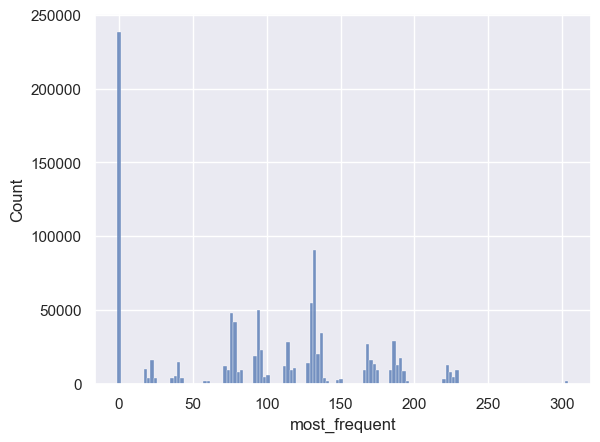

In [800]:
manh = ManhattenTransformer().fit_transform(X = MapGridTransformer().fit_transform(X_train))
sns.histplot(manh['most_frequent'])

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [70]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

In [71]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [72]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [73]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.